# Importamos datos y librerías

In [10]:
from PIL import Image
import matplotlib.pyplot as plt
import random
from astropy.io import fits
from astropy.io import ascii
import pandas as pd
import numpy as np

## sky_dev_v2.fits

In [2]:
path = "SDC2Data/sky_dev_v2.fits"
hdul = fits.open(path)
print(hdul.info())

Filename: SDC2Data/sky_dev_v2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     127   (643, 643, 6668)   float32   
None


In [3]:
numim=len(hdul[0].data)
randompos=random.randrange(numim)
print("Número de imágenes: "+str(numim)+"\n\nMuestra aleatoria de ejemplo, posición: "+str(randompos)+"\n",hdul[0].data[randompos])

Número de imágenes: 6668

Muestra aleatoria de ejemplo, posición: 3091
 [[-1.28515712e-05 -2.46705349e-05 -2.58651035e-05 ... -3.24863322e-05
  -6.38418214e-06  2.75843213e-05]
 [ 2.26711137e-07 -2.61182777e-05 -2.06896220e-05 ... -1.54768150e-05
   1.55243451e-05  1.08668828e-05]
 [-7.73511420e-06 -4.40725671e-05 -1.13892993e-05 ... -2.57418396e-05
  -7.84404438e-06 -2.99808526e-05]
 ...
 [-4.90420371e-06  1.23050895e-05 -1.28786314e-05 ... -1.91650888e-05
   2.26884131e-05  3.31991905e-05]
 [ 6.64760955e-06  1.14223649e-05 -1.66787504e-05 ... -1.86620200e-05
   1.90108294e-05  1.46893390e-05]
 [ 5.62749074e-06  8.07737592e-07 -5.55457245e-06 ... -9.30546412e-06
   1.16681595e-05 -2.81039752e-06]]


## cont_dev.fits

In [5]:
path2 = "SDC2Data/cont_dev.fits"
hdul2 = fits.open(path2)
print(hdul2.info())

Filename: SDC2Data/cont_dev.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     161   (643, 643, 21)   float32   
None


In [6]:
numim=len(hdul2[0].data)
randompos=random.randrange(numim)
print("Número de imágenes: "+str(numim)+"\n\nMuestra aleatoria de ejemplo, posición: "+str(randompos)+"\n",hdul2[0].data[randompos])

Número de imágenes: 21

Muestra aleatoria de ejemplo, posición: 11
 [[-8.8096851e-07 -3.5275239e-06 -3.5302994e-06 ...  1.8517085e-07
  -1.1822425e-06 -3.6950814e-06]
 [-6.4131439e-07 -3.2427181e-06 -2.9277119e-06 ...  3.3204765e-07
  -1.1795377e-06 -2.6039663e-06]
 [-2.1179214e-06 -3.2021092e-06 -1.3938154e-06 ... -1.2300757e-07
  -1.3213911e-06 -1.9100132e-06]
 ...
 [-1.4741402e-06 -3.0609845e-06 -2.5949216e-06 ... -4.2465281e-06
  -2.8139466e-06 -1.5957351e-06]
 [ 1.3133242e-06 -8.9813136e-07 -2.4985829e-06 ... -4.0645937e-06
  -6.1538512e-06 -3.7321104e-06]
 [ 1.2470397e-06  1.2533962e-07 -1.3574881e-06 ... -1.1988645e-06
  -6.1425135e-06 -4.5964116e-06]]


# Gráficos

## Gráficos de la muestra sky_dev_v2.fits 



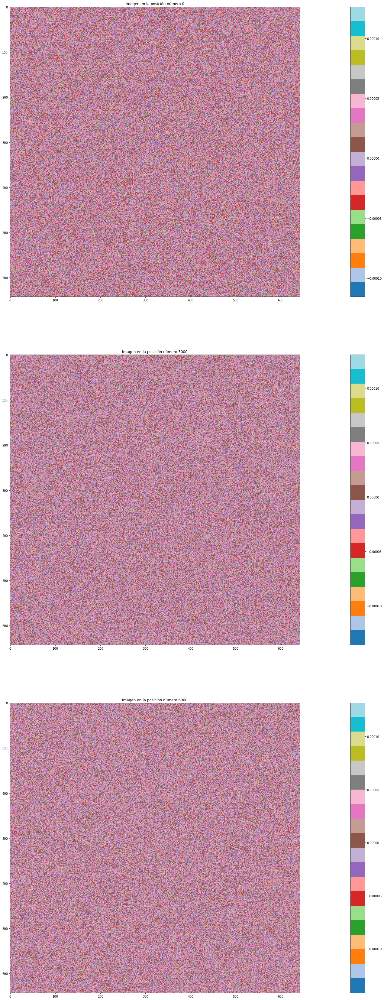

In [7]:
fig, axs = plt.subplots(3, 1, figsize=(60, 60))

im1 = axs[0].imshow(hdul[0].data[0], cmap='tab20')
axs[0].set_title('Imagen en la posición número 0')
fig.colorbar(im1, ax=axs[0])

im2 = axs[1].imshow(hdul[0].data[3000], cmap='tab20')
axs[1].set_title('Imagen en la posición número 3000')
fig.colorbar(im2, ax=axs[1])

im3 = axs[2].imshow(hdul[0].data[6000], cmap='tab20')
axs[2].set_title('Imagen en la posición número 6000')
fig.colorbar(im3, ax=axs[2])

plt.show()

## Gráficos de la muestra cont_dev.fits

In [8]:
hdul2[0].data[0].min()

-9.875852e-06

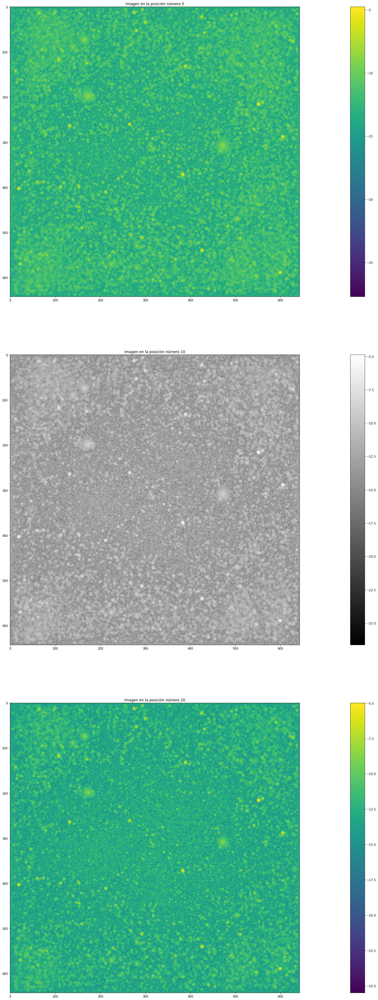

In [11]:
fig, axs = plt.subplots(3, 1, figsize=(60, 60))

im1 = axs[0].imshow(np.log(np.abs(hdul2[0].data[0])))
axs[0].set_title('Imagen en la posición número 0')
fig.colorbar(im1, ax=axs[0])

im2 = axs[1].imshow(np.log(np.abs(hdul2[0].data[10])),cmap="gray")
axs[1].set_title('Imagen en la posición número 10')
fig.colorbar(im2, ax=axs[1])

im3 = axs[2].imshow(np.log(np.abs(hdul2[0].data[20])))
axs[2].set_title('Imagen en la posición número 20')
fig.colorbar(im3, ax=axs[2])

plt.show()


# Catálogo sky_dev_v2.fits

In [14]:
# Leer los datos del archivo de texto
data = ascii.read('E:/space/SDC2Data/sky_dev_truthcat_v2.txt')
data

id,ra,dec,hi_size,line_flux_integral,central_freq,pa,i,w20
int32,float64,float64,float64,float64,float64,float64,float64,float64
0,180.0367431640625,-29.837249755859375,3.7822696294527525,3.698041203815269,1119836160.0,295.4515380859375,87.65090942382812,185.1133452778522
1,179.9273223876953,-30.195167541503906,4.727462741206519,4.06404204296554,1119258112.0,204.154296875,19.59524917602539,127.01663929400442
2,179.7300567626953,-29.959510803222656,5.023231014001445,4.907697409436818,1138250496.0,119.15882873535156,36.59712600708008,218.00412435794686
3,179.7838592529297,-29.76906967163086,2.41584374736941,4.425709459923476,1122002432.0,179.673583984375,68.60360717773438,435.9762487751131
4,179.90086364746094,-30.00284194946289,3.1297862594364703,5.575136075334787,1145224192.0,337.5188903808594,60.04961395263672,328.25891260023303
5,180.0425262451172,-30.01044273376465,2.890633105554849,5.647577878994687,1145574400.0,204.98719787597656,82.60425567626953,176.80141904001252
6,180.19903564453125,-30.090055465698242,2.927574146808172,4.489620226439965,1121802240.0,75.57366180419922,62.8516960144043,338.3078134171949
7,180.10592651367188,-30.182056427001953,2.5035266406092442,4.737801088154173,1121524096.0,230.1378173828125,73.1800537109375,456.1454827488496
8,179.82733154296875,-29.918180465698242,2.712400275919063,6.053636460231165,1145596672.0,32.502197265625,77.27220916748047,465.4704957905872


In [15]:
# # Actualizar los datos del archivo .fit con los datos del archivo de texto
# hdul.update(data)

# # Guardar el archivo actualizado
# hdul.writeto('sky_dev_updated.fit')

AttributeError: 'HDUList' object has no attribute 'update'

In [ ]:
# data_df.head()

In [ ]:
# # Leer los datos del archivo FITS
# data_fits = hdul[0].data

# # Convertir los datos del archivo FITS a un formato de tabla
# data_df = pd.DataFrame(data_fits[0])

# # Almacenar los datos de la tabla en un archivo CSV
# data_df.to_csv('data_fits.csv')

# # Leer los datos del catálogo de texto
# data_txt = ascii.read('/content/drive/MyDrive/TFG/SDC2/sky_dev_truthcat_v2.txt')

# # Convertir los datos de texto a un formato de tabla
# data_txt_df = pd.read_csv('/content/drive/MyDrive/TFG/SDC2/sky_dev_truthcat_v2.txt',sep=" ")

# data_txt_df.head()

In [ ]:

# # Unir los datos del archivo CSV con los del catálogo de texto
# data_df = data_df.merge(data_txt_df, on='ID')

# # Almacenar los datos de la tabla en un archivo CSV
# data_df.to_csv('data_fits_txt.csv')

In [ ]:
# data_df.head(643)

# Simulación de gaussianas

In [ ]:
import random 
import numpy as np

# Ésta función nos va a dar la intensidad de una fuente simulada a partir de el data_cube inicial,
# el valor máximo de las varianzas y el valor máximo de la intensidad de la fuente.


def mock_data( data_cube, sigma_max_xy, sigma_max_z, Amax ):

  

    # Creamos una matriz M de ceros con el tamaño del cubo de datos:
    xmax = np.shape(data_cube)[0]
    ymax = np.shape(data_cube)[1]
    zmax = np.shape(data_cube)[2]
    M = np.zeros((xmax, ymax, zmax))
    # Generamos aleatoriamente la posición media de la fuente en los ejes x, y, z dentro del cubo de datos, así como los valores máximos para la intensidad y las varianzas:
    A = np.random.rand()*Amax #Intensidad (almacenarla y que sea siempre mayor al ruido blanco añadido)
    sigmaxy = np.random.rand()*sigma_max_xy
    sigmaz = np.random.rand()*sigma_max_z
    x_mid = random.randint(0, xmax)
    y_mid = random.randint(0, ymax)
    z_mid = random.randint(0, zmax)
    label_structure={"label":"galaxies", "x":x_mid, "y":y_mid,"width":sigmaxy, "height": sigmaxy}

    # Calculamos una distribución gaussiana para la fuente en los 3 ejes:
    x = (np.arange(0,xmax)-x_mid)**2./(2.*sigmaxy**2.)
    y = (np.arange(0,ymax)-y_mid)**2./(2.*sigmaxy**2.)
    z = (np.arange(0,zmax)-z_mid)**2./(2.*sigmaz**2.)

    X,Y,Z = np.meshgrid(x,y,z)
    
    M = A*np.exp(-X-Y-Z)
    
    return [M,label_structure]

In [ ]:
# definimos el tamaño de los ejes del cubo
x_len = 512
y_len = 512
z_len = 150

# creamos una matriz de (512,512,150) de ceros para almacenar los datos
data_cube = np.zeros((x_len, y_len, z_len))

# definimos las varianzas y la intensidad máxima de las fuentes.

Amax = 1
sigma_max_xy = 10 #Por qué justo 10?
sigma_max_z = 50  #Por qué justo 50?

# Añadimos un ruido blanco a la imagen en todas las frecuencias
Noise = np.reshape(np.random.normal(0, Amax/50, x_len*y_len*z_len), (x_len, y_len, z_len)) # Por qué justo entre 50?
data_cube_noise = data_cube + Noise

# Creamos N fuentes con esas características.

N = 100 #El número de galaxias

fuentes=[] #Almacenamos las fuentes para el label
ax=[]

boxes=[]

for i in range(N):
    mock=mock_data(data_cube_noise, sigma_max_xy, sigma_max_z, Amax)
    boxes.append(mock[1])
    data_cube_noise = data_cube_noise + mock[0]

In [ ]:
from astropy.io import fits
hdulist = fits.HDUList() #instancia HDUList
hdulist.append(fits.PrimaryHDU(data_cube_noise.T))# agregamos nuestro cubo de datos
#Guardamos el cubo
try:
  hdulist.writeto('data_cubo_simulado.fits')
except Exception as e:
  import os
  os.remove('/content/drive/MyDrive/TFG/data_cubo_simulado.fits')
  hdulist.writeto('/content/drive/MyDrive/TFG/data_cubo_simulado.fits')

In [ ]:
hdulist.info()

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       7   (512, 512, 150)   float64   


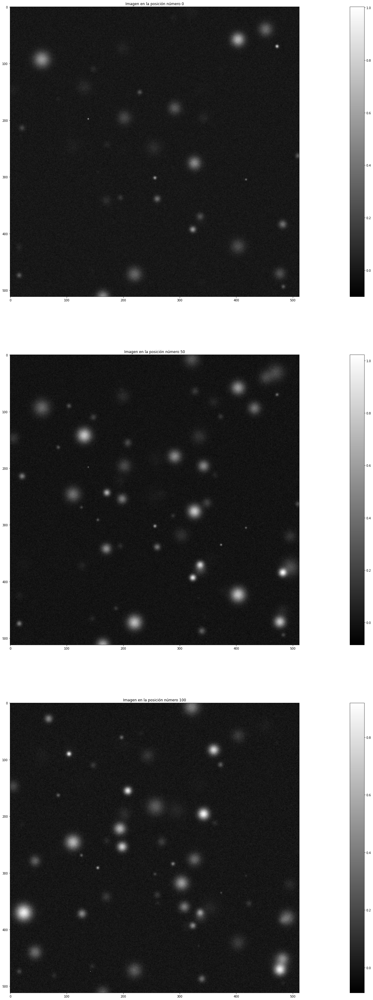

In [ ]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(3, 1, figsize=(60, 60))

im1 = axs[0].imshow(hdulist[0].data[0], cmap="gray")
axs[0].set_title('Imagen en la posición número 0')
fig.colorbar(im1, ax=axs[0])

im2 = axs[1].imshow(hdulist[0].data[50], cmap="gray")
axs[1].set_title('Imagen en la posición número 50')
fig.colorbar(im2, ax=axs[1])

im3 = axs[2].imshow(hdulist[0].data[100], cmap="gray")
axs[2].set_title('Imagen en la posición número 100')
fig.colorbar(im3, ax=axs[2])

plt.show()

# Modelo keras

In [21]:
path = "SDC2Data/data_cubo_simulado.fits"
hdulist = fits.open(path)

In [39]:
from PIL import Image
im = Image.fromarray(hdulist[0].data[15])

im = im.convert("L")
im.save("SDC2Data/imagen2.jpeg")

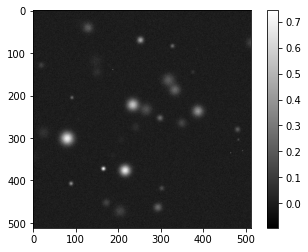

In [41]:


plt.imshow(hdulist[0].data[0], cmap='gray')
plt.colorbar()
plt.savefig("imagen3.jpg")

In [26]:
image_data = fits.getdata(hdulist[0].data[0], ext=0)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [18]:
N = 100

In [19]:
import tensorflow as tf
import numpy as np

# Definimos el modelo
model = tf.keras.models.Sequential()

# Añadimos la primera capa
model.add(tf.keras.layers.Conv2D(64,(3,3), activation = 'relu', input_shape = (512, 512, 150)))
model.add(tf.keras.layers.MaxPooling2D(pool_size = (2,2)))

# Añadimos la segunda capa
model.add(tf.keras.layers.Conv2D(64,(3,3), activation = 'relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size = (2,2)))

# Hacemos un flatten para poder usar una red fully connected
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(64, activation='relu'))

# Añadimos una capa softmax para que podamos clasificar las imágenes
model.add(tf.keras.layers.Dense(2, activation='softmax'))


model.compile(optimizer="rmsprop",
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Preparamos los datos de entrada
X = hdulist[0].data
y = np.concatenate((np.zeros(N), np.ones(X.shape[0]*X.shape[1]*X.shape[2]-N)))

# Entrenamos el modelo
history = model.fit(X,y, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10


ValueError: in user code:

    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1051, in train_function  *
        return step_function(self, iterator)
    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1040, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1030, in run_step  **
        outputs = model.train_step(data)
    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 889, in train_step
        y_pred = self(x, training=True)
    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\utils\traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\Andrés Fernández\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\input_spec.py", line 228, in assert_input_compatibility
        raise ValueError(f'Input {input_index} of layer "{layer_name}" '

    ValueError: Exception encountered when calling layer "sequential_1" (type Sequential).
    
    Input 0 of layer "conv2d_2" is incompatible with the layer: expected min_ndim=4, found ndim=3. Full shape received: (None, 512, 512)
    
    Call arguments received by layer "sequential_1" (type Sequential):
      • inputs=tf.Tensor(shape=(None, 512, 512), dtype=float32)
      • training=True
      • mask=None


In [ ]:
np.shape(data_cube)
data_cube = np.transpose(data_cube, axes=(1,2,0))
np.shape(data_cube)

In [ ]:
# Entrenamos el modelo
data_cube

In [ ]:
!apt-get --yes install libatlas-base-dev

In [ ]:
! curl https://download.astromatic.net/sextractor/sextractor-2.19.5.tar.gz --output sextractor.tar.gz


In [ ]:
!ls

In [ ]:
!tar xzvf sextractor.tar.gz

In [ ]:
!ls

In [ ]:
%cd "sextractor-2.19.5"


In [ ]:
!ls

In [ ]:
!./configure

In [ ]:
!curl https://www.fftw.org/fftw-3.3.10.tar.gz --output fftw.tar.gz

In [ ]:
!tar xzvf fftw.tar.gz

In [ ]:
!./configure

In [ ]:
!make

In [ ]:
!make install

In [ ]:
%cd ..

In [ ]:
!./configure

In [ ]:
!./configure --enable-single --enable-threads

In [ ]:
!./configure -with-atlas=/usr/local/atlas/lib --with-atlas-incdir=/usr/local/atlas/include